# 0. Import package

In [1]:
import os
import cv2
import json
import umap
import numpy as np
from time import time
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from torchvision import datasets, transforms
from scipy.stats import differential_entropy, norm

# 1. Load stimulus data

In [2]:
def load_json(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data

In [3]:
p = '/raid/NeuEvo/data/stimulus/vgg19_pretrained/data/stimulus-topk_s=20.json'
vgg19_stimulus = load_json(p)

In [4]:
base_vocab = {}
for layer in vgg19_stimulus:
    for neuron_idx, imgs in enumerate(vgg19_stimulus[layer]):
        for img in imgs:
            if img not in base_vocab:
                base_vocab[img] = 0
            base_vocab[img] += 1

num_covered_imgs = len(base_vocab)
num_imgs = 1281167
print(f'{num_covered_imgs} imgs are covered ({num_covered_imgs / num_imgs * 100:.2f})%')

56475 imgs are covered (4.41)%


# 2. Load neuron embedding

## 2-1. Load neuron embedding

In [5]:
p_neuron_emb = '/raid/NeuEvo/data/embedding/emb-vgg19_pretrained-topk_s=20-dim=30-lr_emb=0.05-num_emb_epochs=10000-num_emb_negs=3/data/emb/emb.json'
neuron_emb = load_json(p_neuron_emb)

## 2-2. Visualize neuron embedding

### 2-2-1. Dog neurons' embedding

In [55]:
def get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio):
    root = '/raid/NeuEvo/data/neuron_feature'
    return f'{root}/{model_nickname}/data/topk_s={topk_s}-ex_patch_size_ratio={ex_patch_size_ratio}'

def get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    d = get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio)
    paths = []
    for i in range(topk_s):
        paths.append(f'{d}/{layer}-{neuron_idx}-{i}.jpg')
    return paths

def load_img_from_path(p):
    img = cv2.imread(p)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def show_np_imgs_2_rows(imgs, title=None, subplot_titles=None):
    # Create figure
    nrows = 2
    ncols = len(imgs) // nrows
    fig, ax = plt.subplots(nrows, ncols, figsize=(2 * ncols, 2 * nrows))
    fig.tight_layout()
    
    # Create subplots
    for i, img in enumerate(imgs[:nrows * ncols]):
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img) 
        ax[row, col].set_axis_off()
        if subplot_titles is not None:
            ax[row, col].set_title(subplot_titles[i])

    # Title
    if title is not None:
        fig.suptitle(title, y=1.06)
        
    # Show the final plot
    plt.show()

def show_ex_patch(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    img_ps = get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx)
    imgs = [load_img_from_path(img_path) for img_path in img_ps]
    title = f'{model_nickname}, {layer}-{neuron_idx}'
    show_np_imgs_2_rows(imgs, title=title, subplot_titles=None)

In [7]:
vgg19_dog_neurons = [
    'Sequential_0_Conv2d_32-68',
    'Sequential_0_Conv2d_28-80',
    'Sequential_0_Conv2d_30-499',
    'Sequential_0_Conv2d_30-482',
    'Sequential_0_Conv2d_30-153',
    'Sequential_0_Conv2d_25-82',
    'Sequential_0_Conv2d_32-179',
    'Sequential_0_Conv2d_32-63',
]

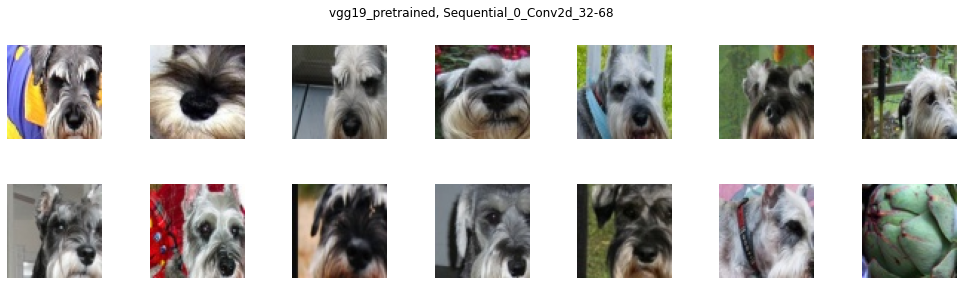

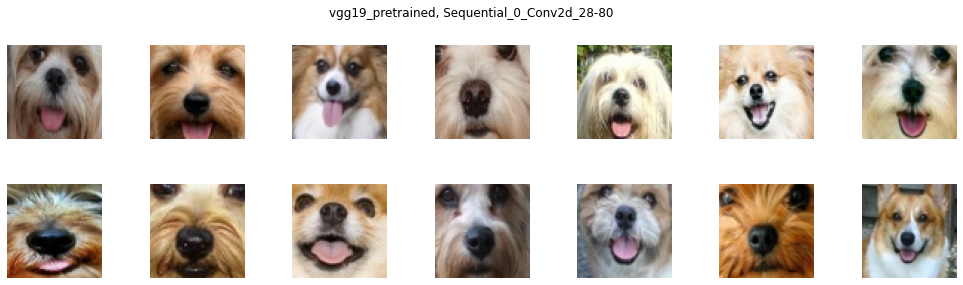

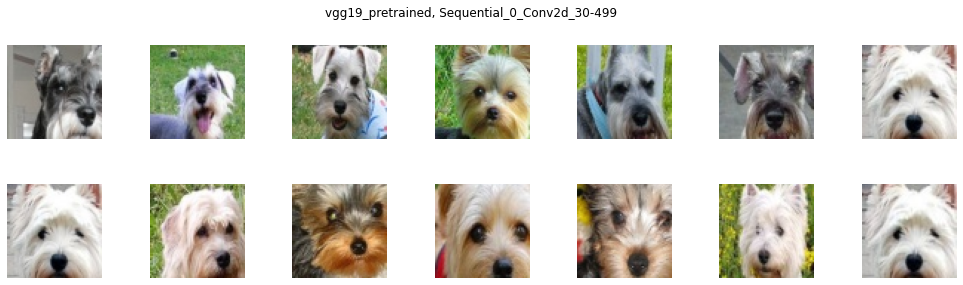

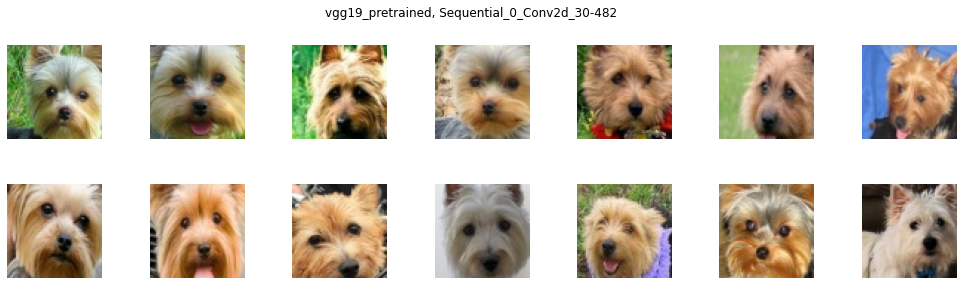

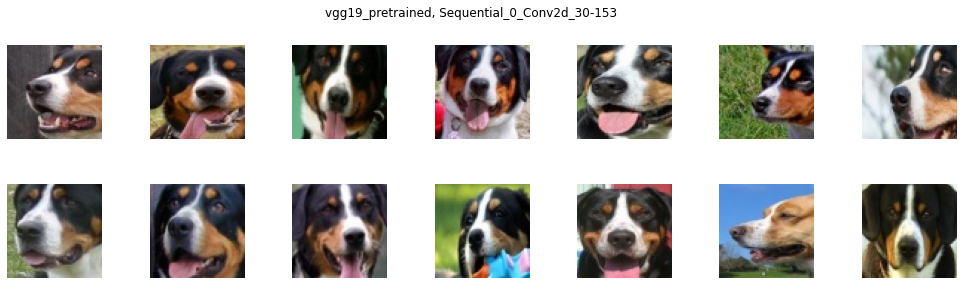

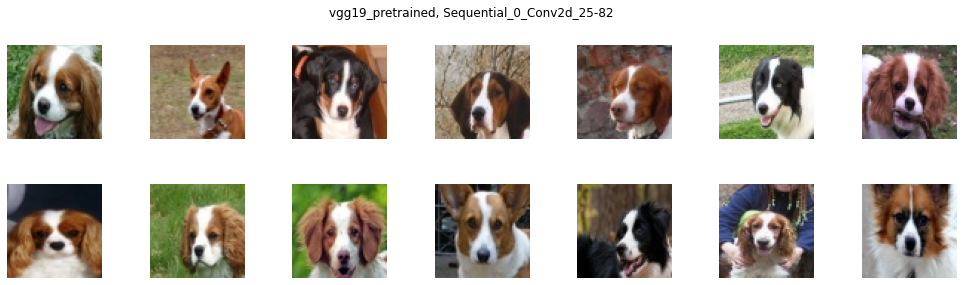

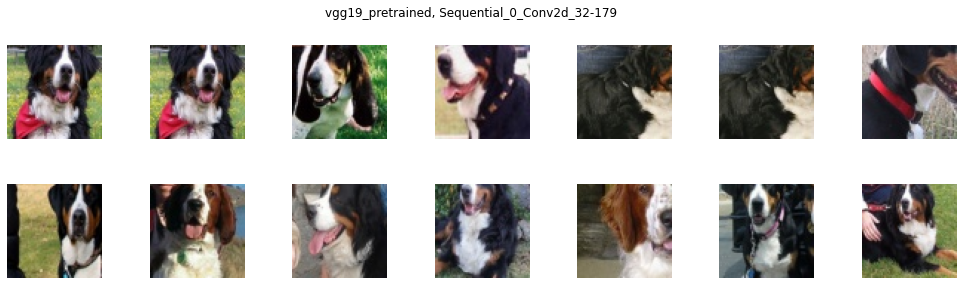

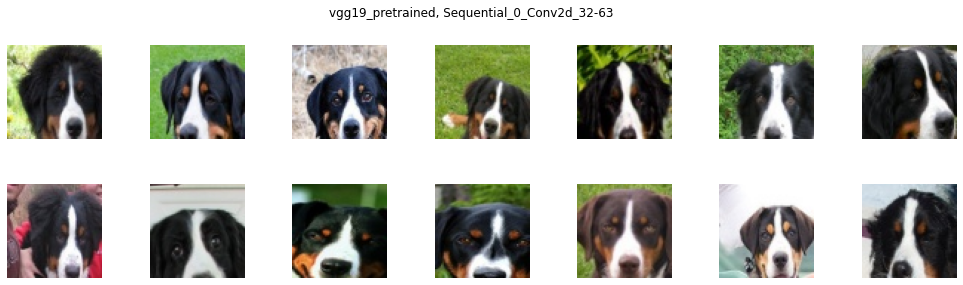

In [8]:
for dog_neuron in vgg19_dog_neurons:
    layer, neuron_idx = dog_neuron.split('-')
    neuron_idx = int(neuron_idx)
    show_ex_patch('vgg19_pretrained', 15, 0.3, layer, neuron_idx)

### 2-2-2. Neuron Embedding 2D

In [9]:
def draw_scatter(Xs, title=None, highlights=[], opacity=0.2):
    X = Xs[:, 0]
    Y = Xs[:, 1]

    plt.figure(figsize=(4, 4))
    plt.scatter(X, Y, s=5, alpha=0.2, color='gray')
    if title is not None:
        plt.title(title)
    if len(highlights) > 0:
        for highlight in highlights:
            X = highlight['Xs'][:, 0]
            Y = highlight['Xs'][:, 1]
            color = highlight['color']
            plt.scatter(X, Y, s=20, alpha=opacity, color=color)
    plt.show() 

In [10]:
neuron_id2idx = {}
neuron_idx2id = {}
num_neurons = len(neuron_emb)
n_X = np.zeros((num_neurons, 30))
for neuron_i, neuron in enumerate(neuron_emb):
    n_X[neuron_i] = neuron_emb[neuron]
    neuron_id2idx[neuron] = neuron_i
    neuron_idx2id[neuron_i] = neuron

In [58]:
reducer = umap.UMAP(n_components=2)
reducer = reducer.fit(n_X)
n_X_2d = reducer.embedding_

In [59]:
dim = 30
zero_vec = np.zeros(dim)
zero_2d = reducer.transform([zero_vec])
print(zero_2d)

[[9.81838   5.9976206]]


In [60]:
vgg19_dog_neuron_idxs = np.array([neuron_id2idx[neuron] for neuron in vgg19_dog_neurons])
vgg19_dog_neuron_Xs = n_X_2d[vgg19_dog_neuron_idxs]

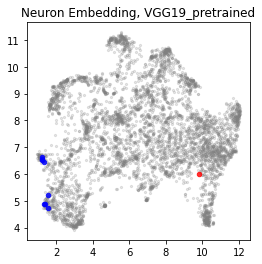

In [61]:
draw_scatter(
    n_X_2d, 
    title="Neuron Embedding, VGG19_pretrained", 
    highlights=[
        {'Xs': vgg19_dog_neuron_Xs, 'color': 'blue'},
        {'Xs': zero_2d, 'color': 'red'}
    ],
    opacity=0.8
)

# 3. Load image pairs

## 3-1. Load image pairs

In [15]:
def get_img_pair_path(model_nickname, layer, num_epochs_co_act, k):
    p = f'/raid/NeuEvo/data/img_pairs/{model_nickname}/data/{layer}/img_pairs-layer={layer}-num_epochs_co_act={num_epochs_co_act}-k={k}.json'
    return p

In [100]:
model_nickname = 'vgg19_pretrained'
layers = [
    # 'Sequential_0_Conv2d_0',
    # 'Sequential_0_Conv2d_2',
    # 'Sequential_0_Conv2d_5',
    # 'Sequential_0_Conv2d_7',
    # 'Sequential_0_Conv2d_10',
    # 'Sequential_0_Conv2d_12',
    # 'Sequential_0_Conv2d_14',
    # 'Sequential_0_Conv2d_16',
    # 'Sequential_0_Conv2d_19',
    # 'Sequential_0_Conv2d_21',
    # 'Sequential_0_Conv2d_23',
    'Sequential_0_Conv2d_25',
    # 'Sequential_0_Conv2d_28',
    # 'Sequential_0_Conv2d_30',
    # 'Sequential_0_Conv2d_32',
    # 'Sequential_0_Conv2d_34'
]

num_epochs_co_act = 100
k = 3

tic = time()
img_pairs = {}
for layer in layers:
    p = get_img_pair_path(model_nickname, layer, num_epochs_co_act, k)
    img_pairs[layer] = load_json(p)
    toc = time()
    print(f'Load img pairs for {layer}: {toc - tic:.2f} sec')

Load img pairs for Sequential_0_Conv2d_25: 772.26 sec


In [101]:
# Aggregate img pairs data across layers
img_pairs_data = {}
total = 0
for layer in layers:
    total += len(img_pairs[layer])
with tqdm(total=total) as pbar:
    for layer in layers:
        for k in img_pairs[layer]:
            key = int(k)
            if key not in img_pairs_data:
                img_pairs_data[key] = {}
            for pair in img_pairs[layer][k]:
                img, cnt = pair
                if img in img_pairs_data[key]:
                    img_pairs_data[key][img] += cnt
                else:
                    img_pairs_data[key][img] = cnt
            pbar.update(1)

100%|█████████████████████████████████████████████████████████| 1281167/1281167 [03:54<00:00, 5466.66it/s]


In [102]:
# Keep only image pairs that are paired more than once
# Image pairs
S = {}
total = len(img_pairs_data)
with tqdm(total=total) as pbar:
    for img in img_pairs_data:
        # S[img] = [nei_cnt_pair for nei_cnt_pair in img_pairs_data[img].items() if nei_cnt_pair[1] > 1]
        # S[img] = [nei_cnt_pair for nei_cnt_pair in img_pairs_data[img].items() if nei_cnt_pair[1] > 2]
        S[img] = [nei_cnt_pair for nei_cnt_pair in img_pairs_data[img].items()]
        pbar.update(1)

100%|████████████████████████████████████████████████████████| 1281167/1281167 [01:29<00:00, 14308.52it/s]


## 3-2. Examples of paired images

In [103]:
raw_data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

raw_training_datasets = datasets.ImageFolder(
    '../../../../ILSVRC2012/train',
    raw_data_transform
)

def show_training_imgs(img_idxs, title=None):
    # Images
    imgs = []
    subplot_titles = []
    for i, img_idx in enumerate(img_idxs):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        imgs.append(img)
        subplot_titles.append(f'{i}-th img: {img_idx}')
        
    # Show images
    show_np_imgs_2_rows(imgs, title=title, subplot_titles=subplot_titles)

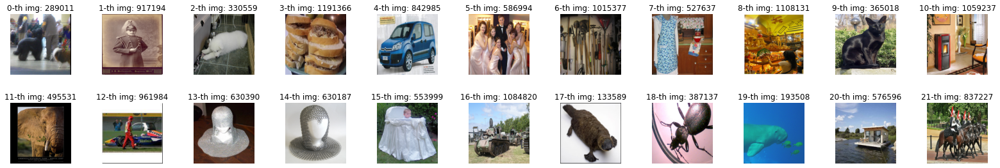

[(917194, 2), (330559, 2), (1191366, 2), (842985, 2), (586994, 2), (1015377, 2), (527637, 2), (1108131, 2), (365018, 1), (1059237, 1), (495531, 1), (961984, 1), (630390, 1), (630187, 1), (553999, 1), (1084820, 1), (133589, 1), (387137, 1), (193508, 1), (576596, 1), (837227, 1), (701533, 1), (644760, 1), (1217680, 1), (725029, 1), (1168172, 1), (128791, 1), (574688, 1), (576539, 1), (1085274, 1), (230415, 1), (817163, 1), (843676, 1), (292245, 1), (656026, 1), (712920, 1), (1159599, 1), (1145062, 1), (723720, 1), (1225667, 1), (267330, 1), (1054943, 1), (30189, 1), (111080, 1), (644714, 1), (1249362, 1), (1242449, 1), (594384, 1), (738398, 1), (434752, 1), (650259, 1), (1240902, 1), (1233025, 1), (400745, 1), (708999, 1), (977817, 1), (1064650, 1), (1244852, 1), (258363, 1), (438658, 1), (998217, 1), (946634, 1), (666342, 1), (610600, 1), (1242879, 1), (188246, 1), (1033621, 1), (540434, 1), (1000308, 1), (235686, 1), (1200285, 1), (740661, 1), (204503, 1), (1162816, 1), (351700, 1), (5

In [104]:
img = 289011
if img not in base_vocab:
    sorted_S_img = sorted(S[img], key=lambda x: x[1], reverse=True)
    neighbor_imgs = [pair[0] for pair in sorted_S_img]
    show_training_imgs([img] + neighbor_imgs[:21])
    print(sorted_S_img)

## 3-3. Get additional vocab

In [105]:
additional_vocab = {}
total = len(S)
with tqdm(total=total) as pbar:
    for img_i in S:
        for img_j, cnt in S[img_i]:
            if img_i not in additional_vocab:
                additional_vocab[img_i] = 0
            if img_j not in additional_vocab:
                additional_vocab[img_j] = 0
            additional_vocab[img_i] += cnt / 2
            additional_vocab[img_j] += cnt / 2
        pbar.update(1)

100%|█████████████████████████████████████████████████████████| 1281167/1281167 [13:41<00:00, 1558.99it/s]


In [106]:
one_hop_vocab = {}
total = len(S)
with tqdm(total=total) as pbar:
    for img_i in S:
        if img_i in base_vocab:
            continue
        for img_j, cnt in S[img_i]:
            if img_j in base_vocab:
                if img_i not in one_hop_vocab:
                    one_hop_vocab[img_i] = 0
                one_hop_vocab[img_i] += cnt
        pbar.update(1)

 96%|█████████████████████████████████████████████████████▌  | 1224692/1281167 [01:53<00:05, 10765.44it/s]


In [107]:
len(additional_vocab)

1281167

In [108]:
len(one_hop_vocab)

1224686

# 4. Load image embedding (from base)

In [109]:
tic = time()

img_emb_p = '/raid/NeuEvo/data/embedding/_etc/_old/vgg19_pretrained/data/img_emb-dim=30-lr_img_emb=10.0-thr_img_emb=0.001-max_iter_img_emb=10000-k=10.txt'
img_emb = np.loadtxt(img_emb_p)

toc = time()
print(f'Load img emb: {toc - tic:.2f} sec')

Load img emb: 21.50 sec


# 5. Learn image embedding (after base)

## 5-1. Dog images for highlighting - 1-hop

In [110]:
# Dog images (not in vocab) before learning
dog_imgs = [
    203208, 239340, 228884, 277441, 305551, 196904, 
    310433, 233075, 202323, 311233, 279092, 280866,
    267298, 271434, 280330, 264400, 228699, 
    311280, 208999, 203684, 216785, 202884,
    309921, 212996, 304773, 218543, 241234, 233352, 332328,
    457649, 203171, 339892, 241430, 261741, 198615, 248227, 199583,
    217360, 332504
]

dog_imgs_one_hop = []
for dog_img in dog_imgs:
    if dog_img in base_vocab:
        continue
    is_one_hop = False
    for j in S[dog_img]:
        if j[0] in base_vocab:
            is_one_hop = True
            break
    if is_one_hop:
        dog_imgs_one_hop.append(dog_img)
        
dog_imgs_one_hop_emb = img_emb[dog_imgs_one_hop]
dog_imgs_one_hop_emb_2d = reducer.transform(dog_imgs_one_hop_emb)

In [111]:
dog_imgs_two_hop = [
    196727, 203589, 203589, 198465, 279720, 295649, 213684,
    200722, 240403, 201523, 266524, 256649, 195682, 255851,
    213484, 276198, 210172, 280030
]

dog_imgs_two_hop_emb = img_emb[dog_imgs_two_hop]
dog_imgs_two_hop_emb_2d = reducer.transform(dog_imgs_two_hop_emb)

## 5-2. Embedding of dog-neurons in ConvNeXt for highlighting

In [112]:
def gen_avg_img_vec(imgs, i_X, dim):
    avg_v = np.zeros(dim)
    for img in imgs:
        avg_v += i_X[img]
    avg_v /= len(imgs)
    return avg_v

In [113]:
convnext_stimulus = load_json('/raid/NeuEvo/data/stimulus/convnext_0.004_96/data/stimulus-topk_s=20.json')

In [114]:
dog_neurons = [
    ['features_5_blk_1', 352],
    ['features_5_blk_2', 0],
    ['features_5_blk_2', 17],
    ['features_5_blk_2', 38],
    ['features_5_blk_2', 64],
    ['features_5_blk_2', 72],
    ['features_5_blk_2', 78],
    ['features_5_blk_2', 86],
    ['features_5_blk_2', 91],
    ['features_5_blk_2', 95],
    ['features_6_blk_1', 661],
    ['features_6_blk_1', 687],
    ['features_6_blk_1', 693],
    ['features_6_blk_1', 696],
    ['features_6_blk_1', 730],
]

In [115]:
dog_neuron_imgs = [convnext_stimulus[layer][neuron] for layer, neuron in dog_neurons]
dog_neuron_imgs_concat = []
for imgs in dog_neuron_imgs:
    for img in imgs:
        dog_neuron_imgs_concat.append(img)

dog_neuron_emb = img_emb[dog_neuron_imgs_concat]
dog_neuron_emb_2d = reducer.transform(dog_neuron_emb)

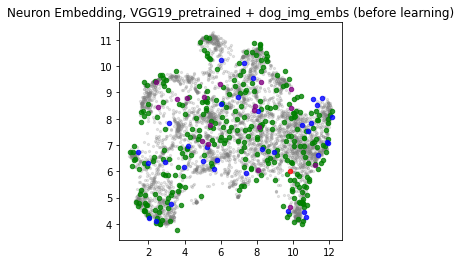

In [116]:
draw_scatter(
    n_X_2d, 
    title="Neuron Embedding, VGG19_pretrained + dog_img_embs (before learning)", 
    highlights=[
        {'Xs': dog_neuron_emb_2d, 'color': 'green'},
        {'Xs': dog_imgs_one_hop_emb_2d, 'color': 'blue'},
        {'Xs': dog_imgs_two_hop_emb_2d, 'color': 'purple'},
        {'Xs': zero_2d, 'color': 'red'},
    ],
    opacity=0.8
)

## 5-3. Learn embedding of images in additional vocab

In [117]:
# Arguments
class Args:
    def __init__(self):
        self.num_imgs = 1281167
        self.dim = 30
        self.max_iter_img_emb = 10
        self.lr_img_emb = 0.01
        self.thr_img_emb = 0.001
        self.lr_img_emb_img_pair = 0.1
        self.max_iter_img_emb_img_pair = 100
        self.alpha = 1

args = Args()

In [118]:
def coeff_fn(x):
    e_minus_x = np.exp(-x)
    return (1 - e_minus_x) / (1 + e_minus_x)

  1%|▌                                                 | 1281167/128116700 [2:45:59<245:58:10, 143.24it/s]

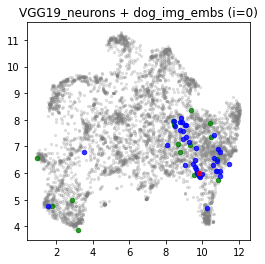

  2%|▉                                                 | 2562326/128116700 [5:31:12<253:56:47, 137.34it/s]

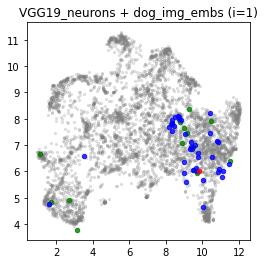

  3%|█▌                                                | 3843501/128116700 [8:16:11<241:13:20, 143.11it/s]

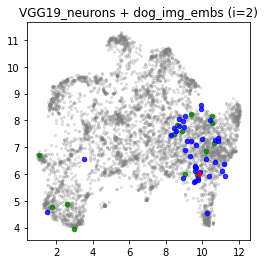

  4%|█▉                                               | 5124659/128116700 [11:01:07<241:47:58, 141.29it/s]

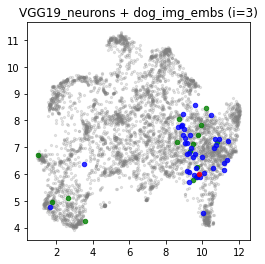

  5%|██▍                                              | 6405823/128116700 [13:46:48<236:35:53, 142.89it/s]

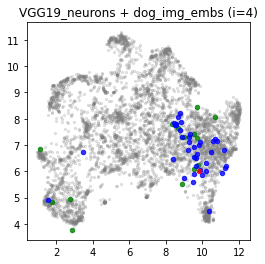

  6%|██▉                                              | 7686988/128116700 [16:33:06<234:12:59, 142.83it/s]

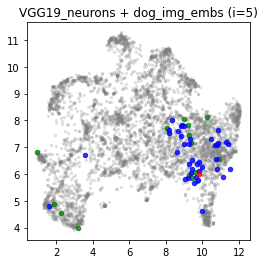

  7%|███▍                                             | 8968166/128116700 [19:18:47<231:43:26, 142.83it/s]

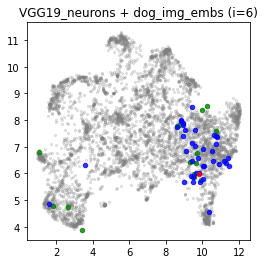

  8%|███▋                                             | 9676073/128116700 [20:50:31<255:07:03, 128.96it/s]


KeyboardInterrupt: 

In [119]:
tic = time()

total = args.max_iter_img_emb_img_pair * len(S)
with tqdm(total=total) as pbar:
    for i in range(args.max_iter_img_emb_img_pair):        
        # Update image embedding
        for img_i in S:
            for img_j, cnt in S[img_i]:
                coeff = coeff_fn(cnt)
                if img_i not in base_vocab:
                    grad_img_i = coeff * (img_emb[img_i] - img_emb[img_j])
                    if img_j in base_vocab:
                        grad_img_i *= args.alpha
                    img_emb[img_i] -= args.lr_img_emb_img_pair * grad_img_i
                if img_j not in base_vocab:
                    grad_img_j = coeff * (img_emb[img_j] - img_emb[img_i])
                    if img_i in base_vocab:
                        grad_img_j *= args.alpha
                    img_emb[img_j] -= args.lr_img_emb_img_pair * grad_img_j
            pbar.update(1)
        
        # Get dog images embedding
        dog_imgs_emb = img_emb[dog_imgs]
        dog_imgs_emb_2d = reducer.transform(dog_imgs_emb)
        
        # Get dog-neurons embedding
        dog_neuron_emb = []
        for dog_neuron, imgs in zip(dog_neurons, dog_neuron_imgs):
            dog_neuron_vec = gen_avg_img_vec(imgs, img_emb, dim)
            dog_neuron_emb.append(dog_neuron_vec)
        # dog_neuron_emb = img_emb[dog_neuron_imgs_concat]
        dog_neuron_emb_2d = reducer.transform(dog_neuron_emb)
        
        # Draw embeddings
        draw_scatter(
            n_X_2d, 
            title=f"VGG19_neurons + dog_img_embs (i={i})", 
            highlights=[
                {'Xs': dog_neuron_emb_2d, 'color': 'green'},
                {'Xs': dog_imgs_emb_2d, 'color': 'blue'},
                {'Xs': zero_2d, 'color': 'red'},
            ],
            opacity=0.8
        )


In [120]:
img_emb.shape

(1281167, 30)

In [121]:
np.savetxt('./data/0509_img_emb_25_all.txt', img_emb)

## 6. Test on ConvNeXt

In [122]:
convnext_stimulus_path = '/raid/NeuEvo/data/stimulus/convnext_0.004_96/data/stimulus-topk_s=20.json'
convnext_stimulus = load_json(convnext_stimulus_path)

In [123]:
convnext_num_neurons = 0
for layer in convnext_stimulus:
    convnext_num_neurons += len(convnext_stimulus[layer])
convnext_num_neurons

8640

In [124]:
convnext_X = np.zeros((convnext_num_neurons, dim))
convnext_neuron_id_to_idx = {}
convnext_neuron_idx_to_id = {}

idx = 0
for layer in convnext_stimulus:
    for i, stimuli in enumerate(convnext_stimulus[layer]):
        neuron_id = f'{layer}-{i}'
        convnext_neuron_id_to_idx[neuron_id] = idx
        convnext_neuron_idx_to_id[idx] = neuron_id
        neuron_vec = gen_avg_img_vec(stimuli, img_emb, dim)
        convnext_X[idx] = neuron_vec
        idx += 1

In [125]:
convnext_X_2d = reducer.transform(convnext_X)

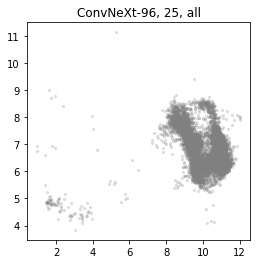

In [127]:
draw_scatter(
    convnext_X_2d, 
    title=f"ConvNeXt-96, 25, all", 
    highlights=[],
    opacity=0.8
)

['features_2_blk_0-85', 'features_4_blk_1-273', 'features_4_blk_1-322', 'features_5_blk_0-85', 'features_5_blk_0-87', 'features_5_blk_0-121', 'features_5_blk_0-237', 'features_5_blk_0-280', 'features_5_blk_0-287', 'features_5_blk_1-14', 'features_5_blk_1-25', 'features_5_blk_1-45', 'features_5_blk_1-64', 'features_5_blk_1-121', 'features_5_blk_1-177', 'features_5_blk_1-239', 'features_5_blk_1-282', 'features_5_blk_1-375', 'features_5_blk_2-25', 'features_5_blk_2-86', 'features_5_blk_2-121', 'features_5_blk_2-177', 'features_5_blk_2-214', 'features_5_blk_2-239', 'features_5_blk_2-375', 'features_5_blk_3-25', 'features_5_blk_3-64', 'features_5_blk_3-121', 'features_5_blk_3-214', 'features_5_blk_3-239', 'features_5_blk_3-351', 'features_5_blk_4-25', 'features_5_blk_4-121', 'features_5_blk_4-214', 'features_5_blk_4-239', 'features_5_blk_4-351', 'features_5_blk_4-375', 'features_5_blk_5-25', 'features_5_blk_5-121', 'features_5_blk_5-214', 'features_5_blk_5-239', 'features_5_blk_5-351', 'fea

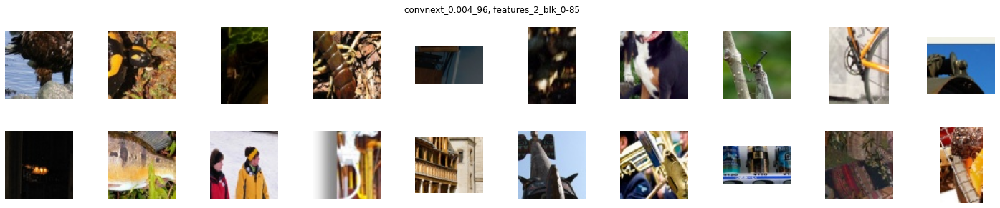

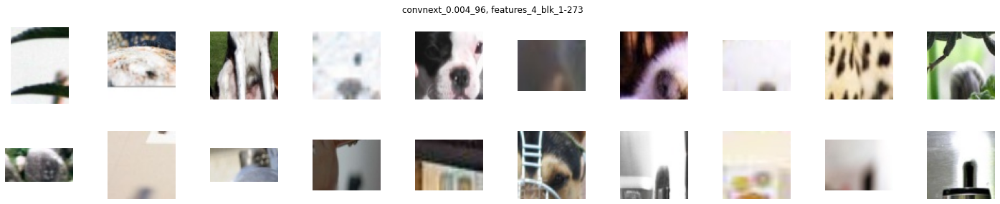

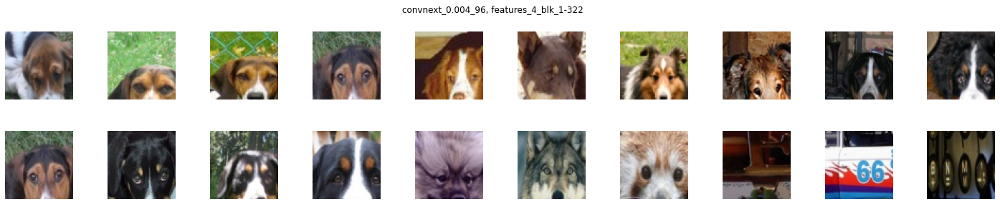

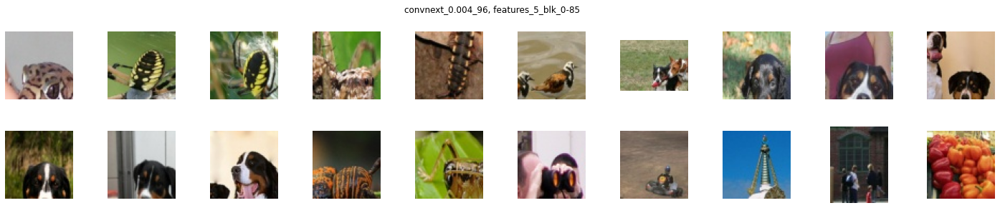

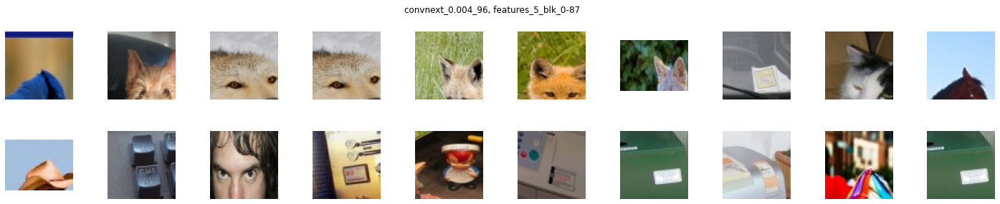

...

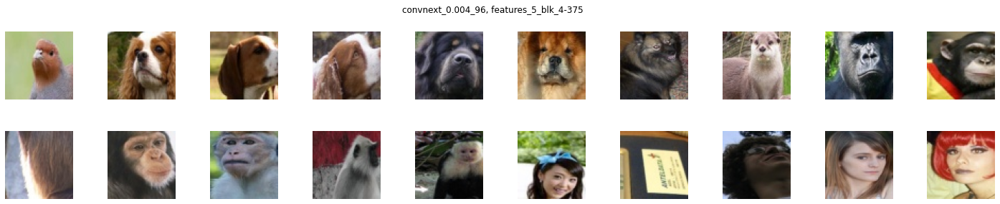

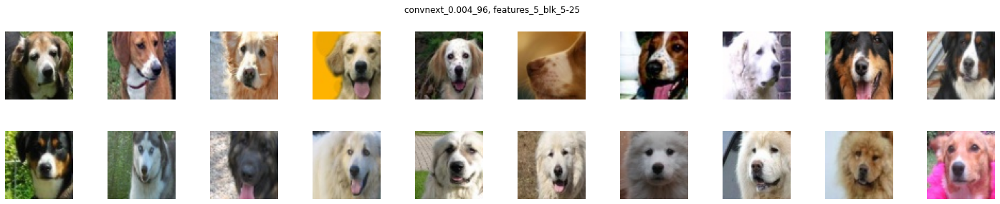

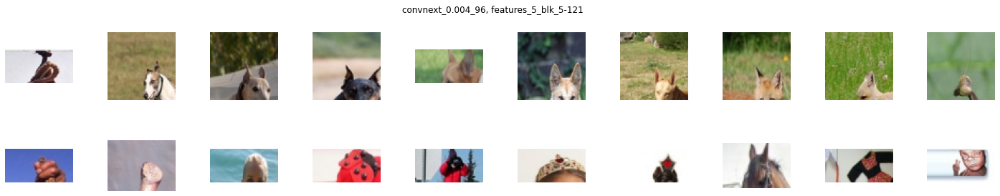

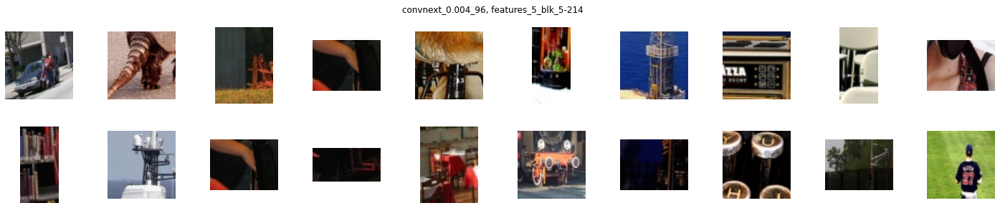

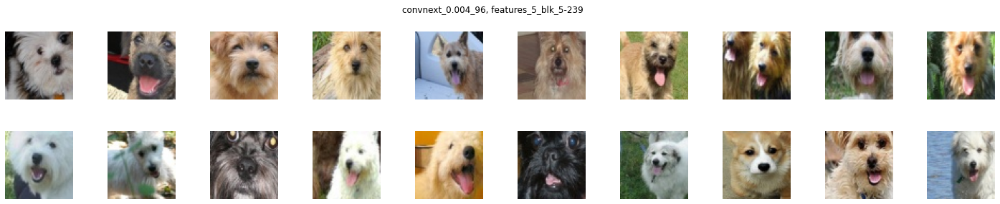

KeyboardInterrupt: 

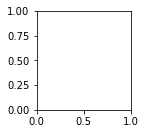

In [128]:
idxs = []
for idx, vec in enumerate(convnext_X_2d):
    x, y = vec[0], vec[1]
    if (1 <= x and x <= 3) and (4 <= y and y <= 6):
        idxs.append(idx)

neuron_ids = [convnext_neuron_idx_to_id[idx] for idx in idxs]
print(neuron_ids)
for neuron_id in neuron_ids:
    layer, neuron_idx = neuron_id.split('-')
    neuron_idx = int(neuron_idx)
    show_ex_patch('convnext_0.004_96', 20, 0.3, layer, neuron_idx)
    
# def show_ex_patch(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
#     img_ps = get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx)
#     imgs = [load_img_from_path(img_path) for img_path in img_ps]
#     title = f'{model_nickname}, {layer}-{neuron_idx}'
#     show_np_imgs_2_rows(imgs, title=title, subplot_titles=None)

In [70]:
neuron_idxs

['features_4_blk_0-34',
 'features_4_blk_1-322',
 'features_5_blk_0-25',
 'features_5_blk_0-85',
 'features_5_blk_0-121',
 'features_5_blk_0-153',
 'features_5_blk_0-157',
 'features_5_blk_0-177',
 'features_5_blk_0-280',
 'features_5_blk_0-287',
 'features_5_blk_0-382',
 'features_5_blk_1-14',
 'features_5_blk_1-25',
 'features_5_blk_1-45',
 'features_5_blk_1-86',
 'features_5_blk_1-118',
 'features_5_blk_1-121',
 'features_5_blk_1-145',
 'features_5_blk_1-177',
 'features_5_blk_1-183',
 'features_5_blk_1-200',
 'features_5_blk_1-232',
 'features_5_blk_1-239',
 'features_5_blk_1-282',
 'features_5_blk_1-331',
 'features_5_blk_1-351',
 'features_5_blk_2-14',
 'features_5_blk_2-25',
 'features_5_blk_2-45',
 'features_5_blk_2-64',
 'features_5_blk_2-86',
 'features_5_blk_2-95',
 'features_5_blk_2-121',
 'features_5_blk_2-122',
 'features_5_blk_2-177',
 'features_5_blk_2-232',
 'features_5_blk_2-239',
 'features_5_blk_2-331',
 'features_5_blk_2-351',
 'features_5_blk_3-25',
 'features_5_b

In [ ]:
# Learn image embedding
def compute_approx_neuron_vec(args, X_n, img_emb):
    vec_sum = np.zeros(args.dim)
    for x in X_n:
        vec_sum += img_emb[x]
    return vec_sum / len(X_n)

def compute_vec_approx_err(v_n_p, v_n):
    diff = v_n_p - v_n
    err = diff.dot(diff)
    return err

def get_stimulus_of_neuron(neuron, stimulus):
    layer, neuron_idx = neuron.split('-')
    neuron_idx = int(neuron_idx)
    return stimulus[layer][neuron_idx]

def compute_gradient(args, img, neuron_emb, img_emb, stimuluated_neurons_by, stimulus):
    grad = np.zeros(args.dim)
    for neuron in stimuluated_neurons_by[img]:
        X_n = get_stimulus_of_neuron(neuron, stimulus)
        v_n = neuron_emb[neuron]
        v_n_p = compute_approx_neuron_vec(args, X_n, img_emb)
        grad += (v_n_p - v_n) / len(X_n)
    return grad



def compute_rmse(args, neuron_emb, img_emb, stimulus):
    err = 0
    num_neurons = len(neuron_emb)
    for neuron in neuron_emb:
        v_n = neuron_emb[neuron]
        X_n = get_stimulus_of_neuron(neuron, stimulus)
        v_n_p = compute_approx_neuron_vec(args, X_n, img_emb)
        err += compute_vec_approx_err(v_n_p, v_n)
    err = np.sqrt(err / num_neurons)
    return err

In [ ]:
len(new_vocab)

In [ ]:
tic = time()

total = args.max_iter_img_emb * (len(stimuluated_neurons_by))
with tqdm(total=total) as pbar:
    for i in range(total):
        # J2
        for img in stimuluated_neurons_by:
            grad_img = compute_gradient(args, img, neuron_emb, img_emb, stimuluated_neurons_by, vgg19_stimulus)
            img_emb[img] -= args.lr_img_emb * grad_img
            pbar.update(1)
            
        # Check convergence
        rmse = compute_rmse(args, neuron_emb, img_emb, vgg19_stimulus)
        if rmse < args.thr_img_emb:
            break
            
        # Check convergence
        rmse = compute_rmse(args, neuron_emb, img_emb, vgg19_stimulus)
        if rmse < args.thr_img_emb:
            break
            
        if i % 100 == 0:
            toc = time()
            print(
                f'iter={i}, rmse={rmse}, cum_time={toc - tic}sec'
            )

In [ ]:
s = f"{i} iterations -> rmse={rmse:.6f}, {(toc - tic) / 60 / 60:.2f} hours"
print(s)

In [ ]:
img_emb.shape

In [ ]:
f_name = './data/20230316-img_emb.txt'
np.savetxt(f_name, img_emb, fmt='%.4f')